This notebook plots various diagnostics of the number of joint wind speed & precipitation extremes.

In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
%config InlineBackend.figure_format = 'retina'
from globe import is_land
from open_CMIP6_num_joint_extremes import open_CMIP6_num_joint_extremes_wp

In [3]:
def subplot_n_wp_eu(da,gridspec_idx,subplot_title,cmap,v,plot_cbar,cbar_label=None):
    ax = plt.subplot(gs[gridspec_idx[0],gridspec_idx[-1]],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=da.plot(cmap=cmap,vmin=v[0],vmax=v[-1],transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
    sc.set_edgecolor('face')
    ax.coastlines(zorder=5)
    ax.set_extent([-24, 13, 35, 65], crs=ccrs.PlateCarree())
    if plot_cbar:
        cax=ax.inset_axes(bounds=(0, -.1,1,.075))
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label=cbar_label)
    ax.set_title(subplot_title)
    return ax,sc

Load output of joint probability analysis:

In [4]:
ssps = ['ssp245','ssp585']

#load wind speed & precipitation:
numex_ds = open_CMIP6_num_joint_extremes_wp('/home/jovyan/CMIP6cex/output/num_extremes/timeseries_eu_1p5/sfcWind_pr/40yr_p98_lag0d_declus1d_ref2000/',
                                            '/home/jovyan/CMIP6cex/output/num_extremes/timeseries_eu_gesla2_tgs/surge_pr/40yr_p98_lag0d_declus1d_ref2000/',
                                            ssps)

num_joint_wp = numex_ds.num_joint_extremes.load() #load into memory
num_joint_wp_isect = num_joint_wp.where(np.isfinite(num_joint_wp).all(dim=['ssp','latitude','longitude']),drop=True) #get the intersection of members with both SSPs available

In [5]:
#determine where land and ocean
[LON,LAT] = np.meshgrid(numex_ds.longitude,numex_ds.latitude)
land = is_land(LAT,LON)

In [6]:
#show availability of initial-condition members
np.isfinite(num_joint_wp.isel(longitude=0,latitude=0,month=0,window=-1)).sum(dim='member_id')
#np.isfinite(num_joint_wp_isect.isel(longitude=0,latitude=0,month=0,window=-1)).sum(dim='member_id')

<xarray.DataArray 'num_joint_extremes' (ssp: 2, source_id: 27)>
array([[ 5, 38,  2,  3,  1,  1, 25, 59,  1,  1,  1,  1,  5,  0,  1,  1,
        11,  3, 10, 43,  2, 24,  1,  3,  2,  1,  5],
       [ 6, 35,  2,  3,  1,  1, 25,  1,  0,  0,  1,  1,  4,  4,  1,  1,
         7,  3,  1, 50,  2, 24,  1,  1,  1,  1,  5]])
Coordinates:
  * source_id  (source_id) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'UKESM1-0-LL'
    latitude   float64 70.0
    longitude  float64 -30.0
    window     int64 2080
    month      int64 1
    height     float64 10.0
    quantile   float64 0.98
  * ssp        (ssp) <U6 'ssp245' 'ssp585'

Plot ensemble mean (d)N WP:

<xarray.DataArray 'num_joint_extremes' ()>
array(-7.39844524)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp245'
<xarray.DataArray 'num_joint_extremes' ()>
array(-10.87190161)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp585'
<xarray.DataArray 'num_joint_extremes' ()>
array(3.89672055)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp245'
<xarray.DataArray 'num_joint_extremes' ()>
array(6.1291405)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp585'


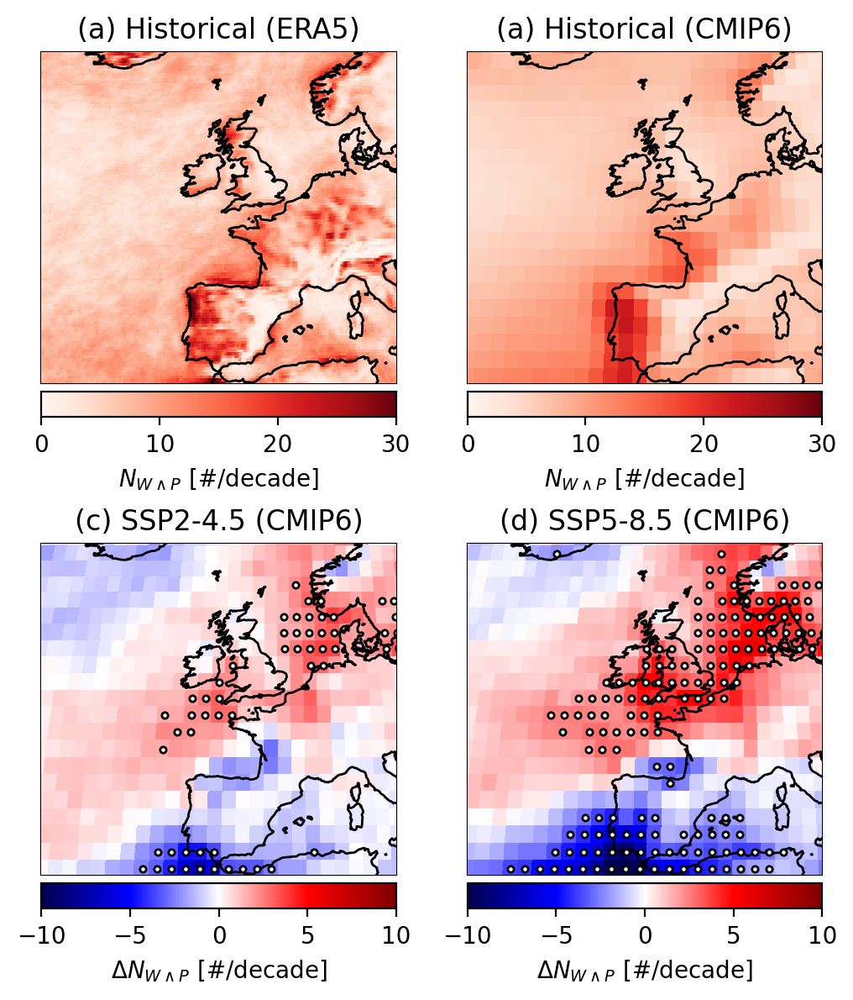

In [8]:
#plot (d)N WP
fig=plt.figure(figsize=(6,7.25)) #generate figure  
gs = fig.add_gridspec(2,2)
gs.update(hspace=.1)

numex = num_joint_wp_isect.sum(dim='month',skipna=False)
dnumex = numex.sel(window=2080)-numex.sel(window=2000)

#subplot ERA5
era5 = xr.open_dataset('/home/jovyan/CMIP6cex/extremes_analysis/n_wp_eu_1p5_era5.nc')
ax,sc = subplot_n_wp_eu(era5.num_joint_extremes,[0,0],
                        '(a) Historical (ERA5)','Reds',[0,30],plot_cbar=True,cbar_label='$N_{W\wedge P}$ [#/decade]')

#subplot Historical
ax,sc = subplot_n_wp_eu(.25*numex.sel(window=2000).sel(ssp='ssp245').mean(dim='member_id').mean(dim='source_id'),[0,1],
                        '(a) Historical (CMIP6)','Reds',[0,30],plot_cbar=True,cbar_label='$N_{W\wedge P}$ [#/decade]')

#subplot SSP245
ax,sc = subplot_n_wp_eu(.25*dnumex.sel(ssp='ssp245').mean(dim='member_id').mean(dim='source_id'),[1,0],
                        '(c) SSP2-4.5 (CMIP6)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [#/decade]')
#stipple where mean larger than standard deviation
mean_lt_std = np.abs(dnumex.sel(ssp='ssp245').mean(dim='member_id').mean(dim='source_id'))>np.abs(dnumex.sel(ssp='ssp245').mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=7)

#subplot SSP585
ax,sc = subplot_n_wp_eu(.25*dnumex.sel(ssp='ssp585').mean(dim='member_id').mean(dim='source_id'),[1,1],
                        '(d) SSP5-8.5 (CMIP6)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [#/decade]')
#stipple where mean larger than standard deviation
mean_lt_std = np.abs(dnumex.sel(ssp='ssp585').mean(dim='member_id').mean(dim='source_id'))>np.abs(dnumex.sel(ssp='ssp585').mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=7)

#print magnitude of min and max changes
print(.25*dnumex.sel(ssp='ssp245').where((dnumex.latitude>34) & (dnumex.latitude<66) & (dnumex.longitude>-25) & (dnumex.longitude<14)).mean(dim='member_id').mean(dim='source_id').min())
print(.25*dnumex.sel(ssp='ssp585').where((dnumex.latitude>34) & (dnumex.latitude<66) & (dnumex.longitude>-25) & (dnumex.longitude<14)).mean(dim='member_id').mean(dim='source_id').min())

print(.25*dnumex.sel(ssp='ssp245').where((dnumex.latitude>34) & (dnumex.latitude<66) & (dnumex.longitude>-25) & (dnumex.longitude<14)).mean(dim='member_id').mean(dim='source_id').max())
print(.25*dnumex.sel(ssp='ssp585').where((dnumex.latitude>34) & (dnumex.latitude<66) & (dnumex.longitude>-25) & (dnumex.longitude<14)).mean(dim='member_id').mean(dim='source_id').max())

#fig.savefig('Figures/ensmean_dN_WP_v2.pdf',format='pdf',dpi=300,bbox_inches='tight') #save to pdf

Plot ensemble standard deviation:

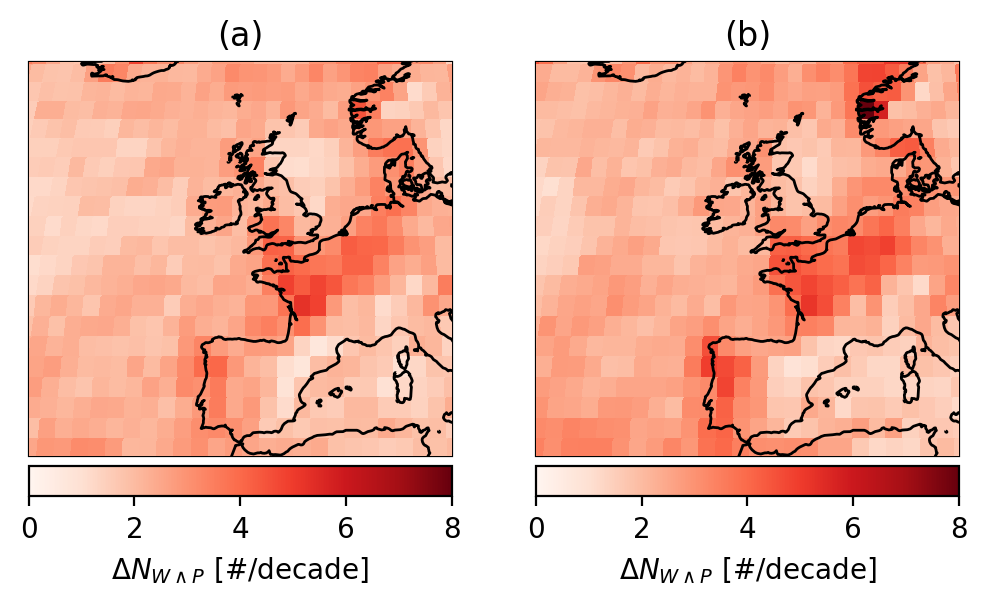

In [8]:
fig=plt.figure(figsize=(6,7.25)) #generate figure  
gs = fig.add_gridspec(2,2)
gs.update(hspace=.2)

numex = num_joint_wp_isect.sum(dim='month',skipna=False)
dnumex = numex.sel(window=2080)-numex.sel(window=2000)

#subplot SSP245
ax,sc = subplot_n_wp_eu(.25*dnumex.sel(ssp='ssp245').mean(dim='member_id').std(dim='source_id'),[0,0],
                        '(a)','Reds',[0,8],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [#/decade]')
#subplot SSP585
ax,sc = subplot_n_wp_eu(.25*dnumex.sel(ssp='ssp585').mean(dim='member_id').std(dim='source_id'),[0,1],
                        '(b)','Reds',[0,8],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [#/decade]')
#fig.savefig('Figures/ensspread_dN_WP.pdf',format='pdf',dpi=300,bbox_inches='tight')

Compute how much larger standard deviation becomes if using single members

In [9]:
for s,ssp in enumerate(ssps):
    
    numex = num_joint_wp_isect.sum(dim='month',skipna=False)
    dnumex = numex.sel(window=2080)-numex.sel(window=2000)
    dnumex_ssp = dnumex.sel(ssp=ssp)

    finite_mems = np.isfinite(dnumex_ssp.isel(latitude=0,longitude=0))

    members= np.zeros((len(dnumex_ssp.source_id)))
    for i in np.arange(len(dnumex_ssp.source_id)):
        try:
            members[i] = np.where(finite_mems[i,:])[0][0]
        except:
            members[i] = 0
    ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':dnumex_ssp.source_id})

    onemem_ens = dnumex_ssp.isel(member_id=ix.astype('int')).dropna(dim='source_id')

    print(((onemem_ens.std(dim='source_id')-dnumex_ssp.mean(dim='member_id').std(dim='source_id'))/dnumex_ssp.mean(dim='member_id').std(dim='source_id')).where(land).mean())

<xarray.DataArray 'num_joint_extremes' ()>
array(0.14687957)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp245'
<xarray.DataArray 'num_joint_extremes' ()>
array(0.11259904)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp585'


Plot & print percentage-change:

39.23519410419609
50.923219190979204


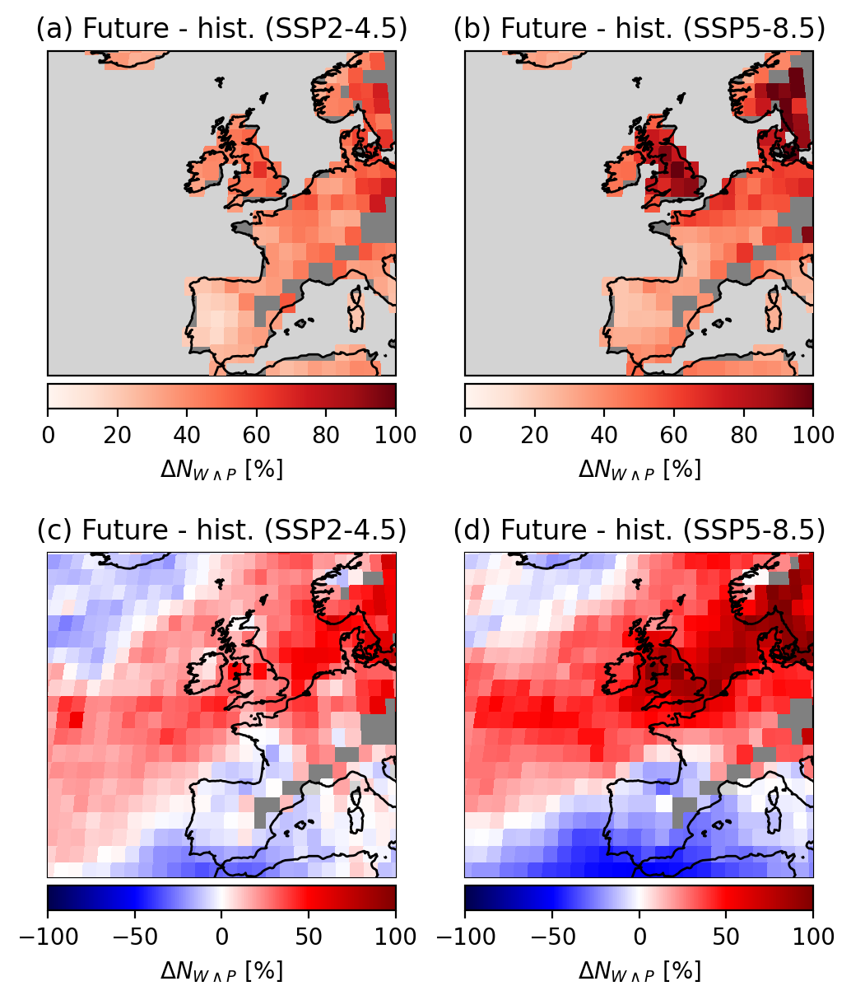

In [10]:
fig=plt.figure(figsize=(6,7.25)) #generate figure  
gs = fig.add_gridspec(2,2)
gs.update(hspace=.2)

#for s,ssp in enumerate(ssps):
numex = num_joint_wp_isect.sum(dim='month',skipna=False)
dnumex = numex.sel(window=2080)-numex.sel(window=2000)

#only over continents:
land_pct_change = (100*np.abs(dnumex)/numex.sel(window=2000)).mean(dim='member_id').mean(dim='source_id').where(land)
land_pct_change = land_pct_change.where(np.isfinite(land_pct_change)) 
land_pct_change = land_pct_change.where((land_pct_change.latitude>34) & (land_pct_change.latitude<66) & (land_pct_change.longitude>-25) & (land_pct_change.longitude<14))

#print mean changes on land
print(np.nanmean(land_pct_change.sel(ssp='ssp245').values))
print(np.nanmean(land_pct_change.sel(ssp='ssp585').values))

#plot absolute change % of historical
ax,sc = subplot_n_wp_eu(land_pct_change.sel(ssp='ssp245'),[0,0],
                        '(a) Future - hist. (SSP2-4.5)','Reds',[0,100],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [%]')
ax,sc = subplot_n_wp_eu(land_pct_change.sel(ssp='ssp585'),[0,1],
                        '(b) Future - hist. (SSP5-8.5)','Reds',[0,100],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [%]')
#plot change % of historical
ax,sc = subplot_n_wp_eu((100*dnumex/numex.sel(window=2000)).sel(ssp='ssp245').mean(dim='member_id').mean(dim='source_id'),[1,0],
                        '(c) Future - hist. (SSP2-4.5)','seismic',[-100,100],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [%]')
ax,sc = subplot_n_wp_eu((100*dnumex/numex.sel(window=2000)).sel(ssp='ssp585').mean(dim='member_id').mean(dim='source_id'),[1,1],
                        '(d) Future - hist. (SSP5-8.5)','seismic',[-100,100],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [%]')

Plot decomposition of dN_wp:

In [11]:
#load data needed for composition of dN_wp
num_joint_wp_decomp = numex_ds[['num_joint_extremes','num_joint_extremes_pr_driven',
                              'num_joint_extremes_sfcWind_driven','num_joint_extremes_sfcWind_pr_driven']].load()

#get the intersection members available for both SSPs
num_joint_wp_decomp_isect = num_joint_wp_decomp.where(np.isfinite(num_joint_wp_decomp.num_joint_extremes).all(dim=['ssp','latitude','longitude']),drop=True) 

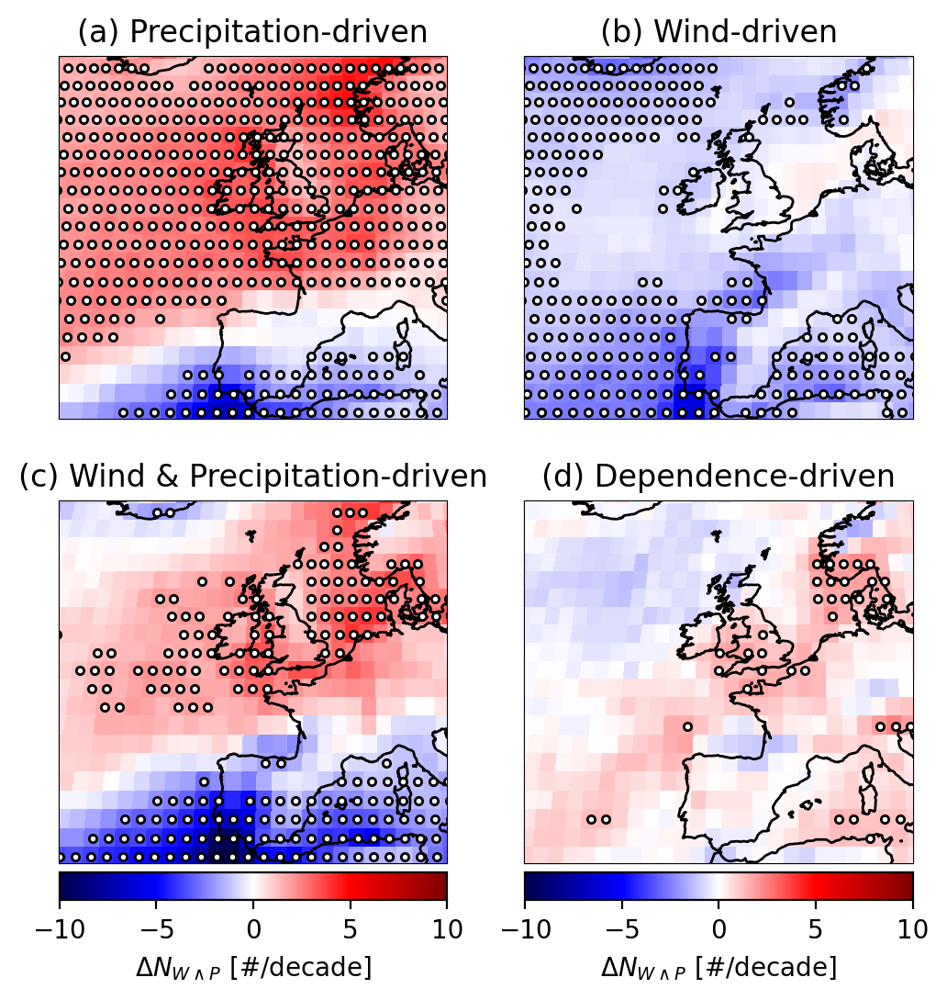

In [12]:
fig=plt.figure(figsize=(6,6)) #generate figure  
gs = fig.add_gridspec(2,2)
gs.update(hspace=.1)

ssp='ssp585'

numex = num_joint_wp_decomp_isect.sel(ssp=ssp).sum(dim='month',skipna=False)
dnumex = numex.sel(window=2080)-numex.sel(window=2000)

#pr driven
ax,sc = subplot_n_wp_eu(.25*dnumex.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id'),[0,0],
                        '(a) Precipitation-driven','seismic',[-10,10],plot_cbar=False)
mean_lt_std = np.abs(dnumex.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dnumex.num_joint_extremes_pr_driven.mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)

#sfcWind driven
ax,sc = subplot_n_wp_eu(.25*dnumex.num_joint_extremes_sfcWind_driven.mean(dim='member_id').mean(dim='source_id'),[0,1],
                        '(b) Wind-driven','seismic',[-10,10],plot_cbar=False)
mean_lt_std = np.abs(dnumex.num_joint_extremes_sfcWind_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dnumex.num_joint_extremes_sfcWind_driven.mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)

#precipitation-driven and wind-driven
ax,sc = subplot_n_wp_eu(.25*dnumex.num_joint_extremes_sfcWind_pr_driven.mean(dim='member_id').mean(dim='source_id'),[1,0],
                        '(c) Wind & Precipitation-driven','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [#/decade]')
mean_lt_std = np.abs(dnumex.num_joint_extremes_sfcWind_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dnumex.num_joint_extremes_sfcWind_pr_driven.mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)

#dpendence-driven
dependence_driven = (dnumex.num_joint_extremes-dnumex.num_joint_extremes_sfcWind_pr_driven)

ax,sc = subplot_n_wp_eu(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id'),[1,1],
                        '(d) Dependence-driven','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [#/decade]')
mean_lt_std = np.abs(dependence_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dependence_driven.mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)

#fig.savefig('Figures/ensmean_dN_WP_decomp_SSP585_v2.pdf',format='pdf',dpi=300,bbox_inches='tight')

Decomposition SSP2-4.5

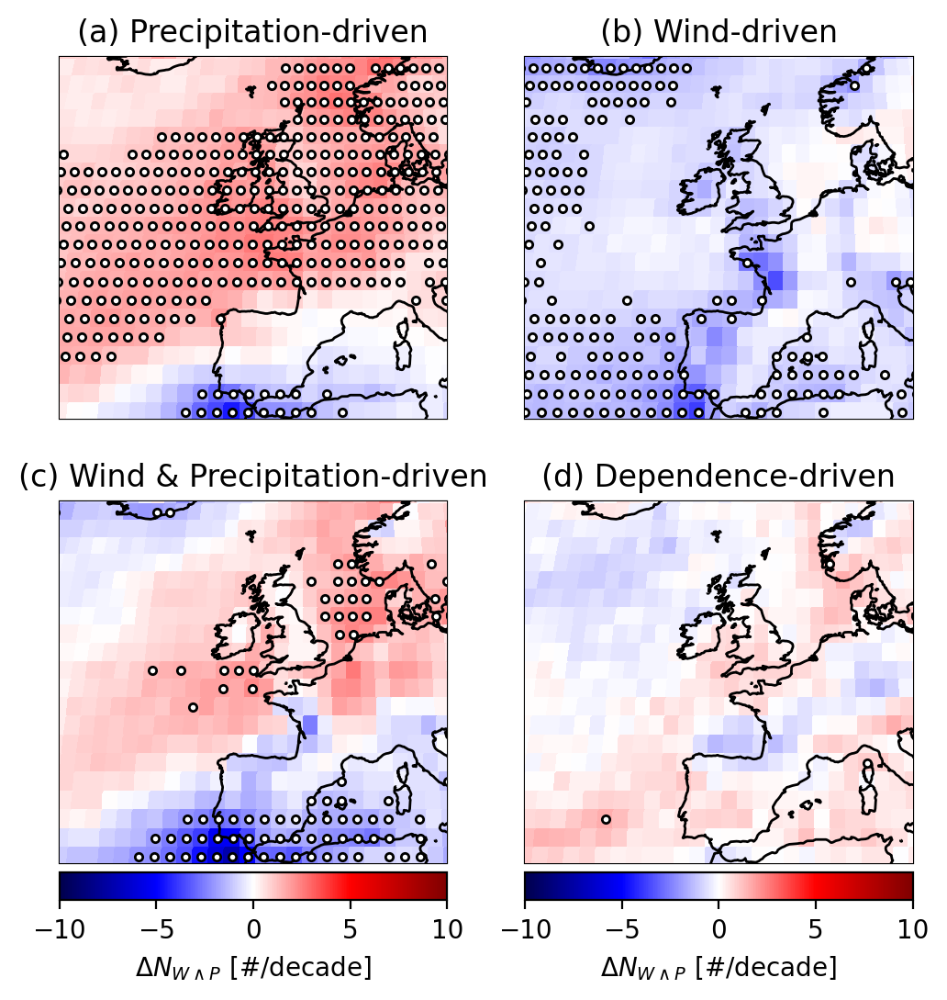

In [13]:
fig=plt.figure(figsize=(6,6)) #generate figure  
gs = fig.add_gridspec(2,2)
gs.update(hspace=.1)

ssp='ssp245'

numex = num_joint_wp_decomp_isect.sel(ssp=ssp).sum(dim='month',skipna=False)
dnumex = numex.sel(window=2080)-numex.sel(window=2000)

#pr driven
ax,sc = subplot_n_wp_eu(.25*dnumex.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id'),[0,0],
                        '(a) Precipitation-driven','seismic',[-10,10],plot_cbar=False)
mean_lt_std = np.abs(dnumex.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dnumex.num_joint_extremes_pr_driven.mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)

#sfcWind driven
ax,sc = subplot_n_wp_eu(.25*dnumex.num_joint_extremes_sfcWind_driven.mean(dim='member_id').mean(dim='source_id'),[0,1],
                        '(b) Wind-driven','seismic',[-10,10],plot_cbar=False)
mean_lt_std = np.abs(dnumex.num_joint_extremes_sfcWind_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dnumex.num_joint_extremes_sfcWind_driven.mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)

#precipitation-driven and wind-driven
ax,sc = subplot_n_wp_eu(.25*dnumex.num_joint_extremes_sfcWind_pr_driven.mean(dim='member_id').mean(dim='source_id'),[1,0],
                        '(c) Wind & Precipitation-driven','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [#/decade]')
mean_lt_std = np.abs(dnumex.num_joint_extremes_sfcWind_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dnumex.num_joint_extremes_sfcWind_pr_driven.mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)

#dpendence-driven
dependence_driven = (dnumex.num_joint_extremes-dnumex.num_joint_extremes_sfcWind_pr_driven)

ax,sc = subplot_n_wp_eu(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id'),[1,1],
                        '(d) Dependence-driven','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{W\wedge P}$ [#/decade]')
mean_lt_std = np.abs(dependence_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dependence_driven.mean(dim='member_id').std(dim='source_id'))
ax.scatter(LON.flatten()[mean_lt_std.values.flatten()],LAT.flatten()[mean_lt_std.values.flatten()],edgecolor='black',facecolor='white',transform=ccrs.PlateCarree(),zorder=7,marker='o',s=9)

#fig.savefig('Figures/ensmean_dN_WP_decomp_SSP245_v2.pdf',format='pdf',dpi=300,bbox_inches='tight')

Plot (d)N_wp per model:

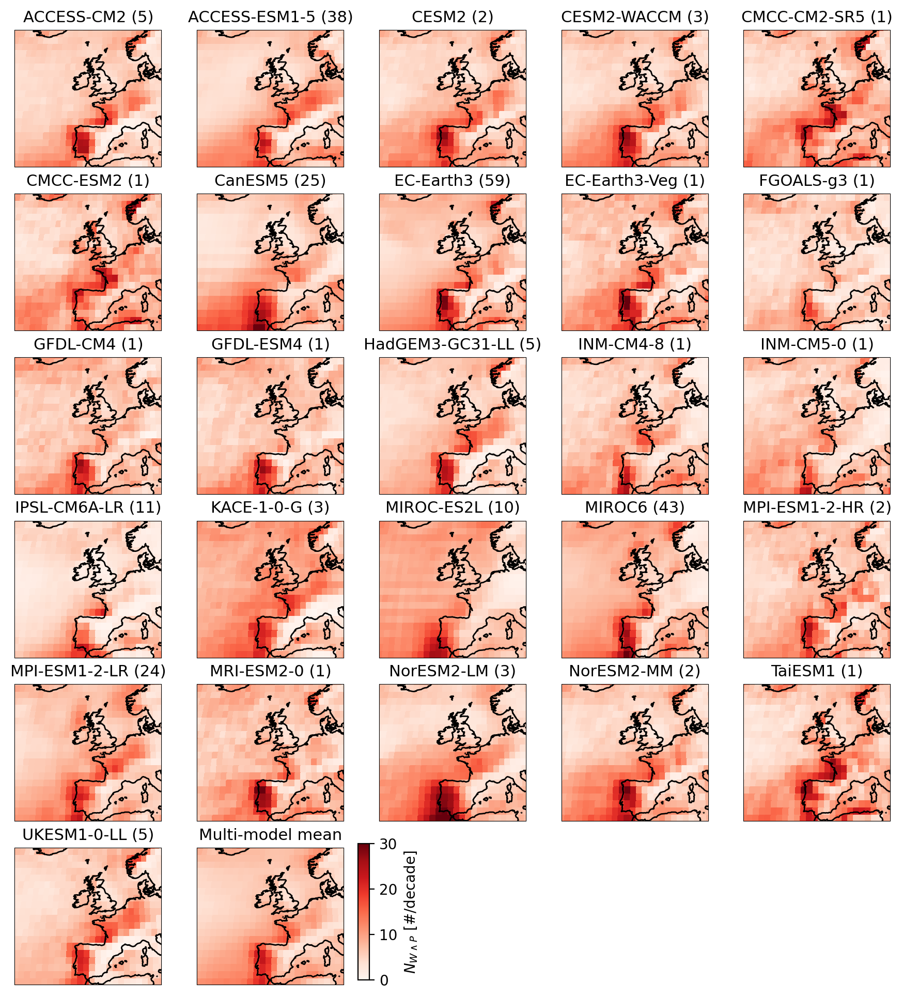

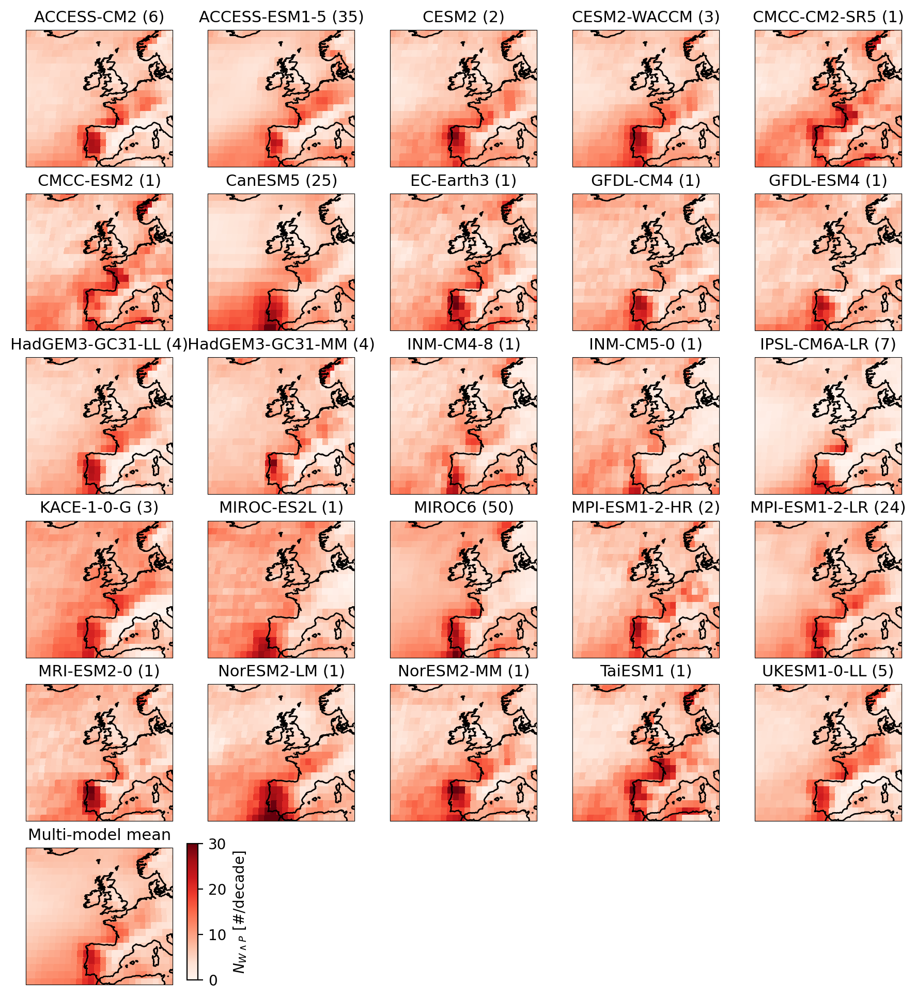

In [20]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_wp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(11,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    for m,model in enumerate(ssp_ds.source_id.values):
        n_members = np.isfinite(ssp_ds_present.sel(source_id=model)).sum(dim='member_id')[0,0].values
        if n_members==0:
            continue
        
        ax,sc = subplot_n_wp_eu(.25*ssp_ds_present.sel(source_id=model).mean(dim='member_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','Reds',[0,30],plot_cbar=False)
        ax.set_title(model +' ('+str(n_members)+')',size=11)
        i+=1
        if m==len(ssp_ds.source_id.values)-1:
            ax,sc = subplot_n_wp_eu(.25*ssp_ds_present.mean(dim='member_id').mean(dim='source_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','Reds',[0,30],plot_cbar=False)  
            ax.set_title('Multi-model mean',size=11)
            cax=ax.inset_axes(bounds=(1.1, 0.035,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$N_{W\wedge P}$ [#/decade]')
  
    #fig.savefig('Figures/n_WP_per_model_'+ssp+'.jpg',format='jpg',dpi=300,bbox_inches='tight')    

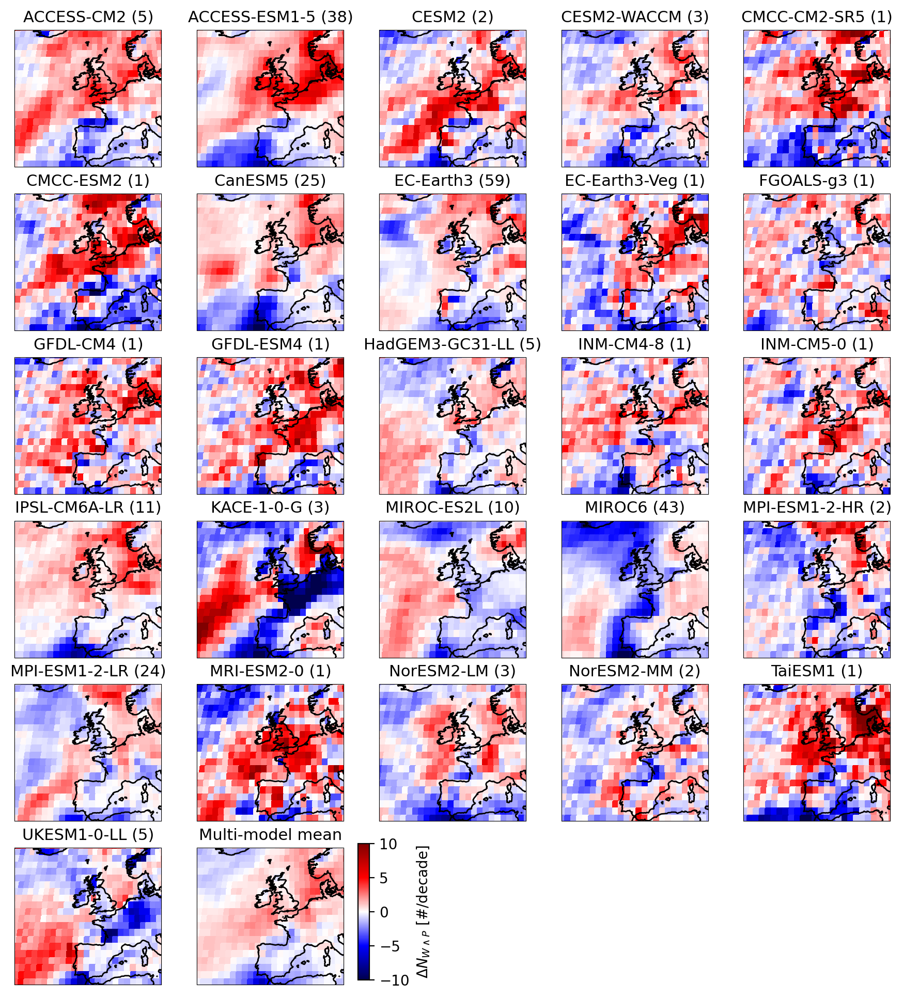

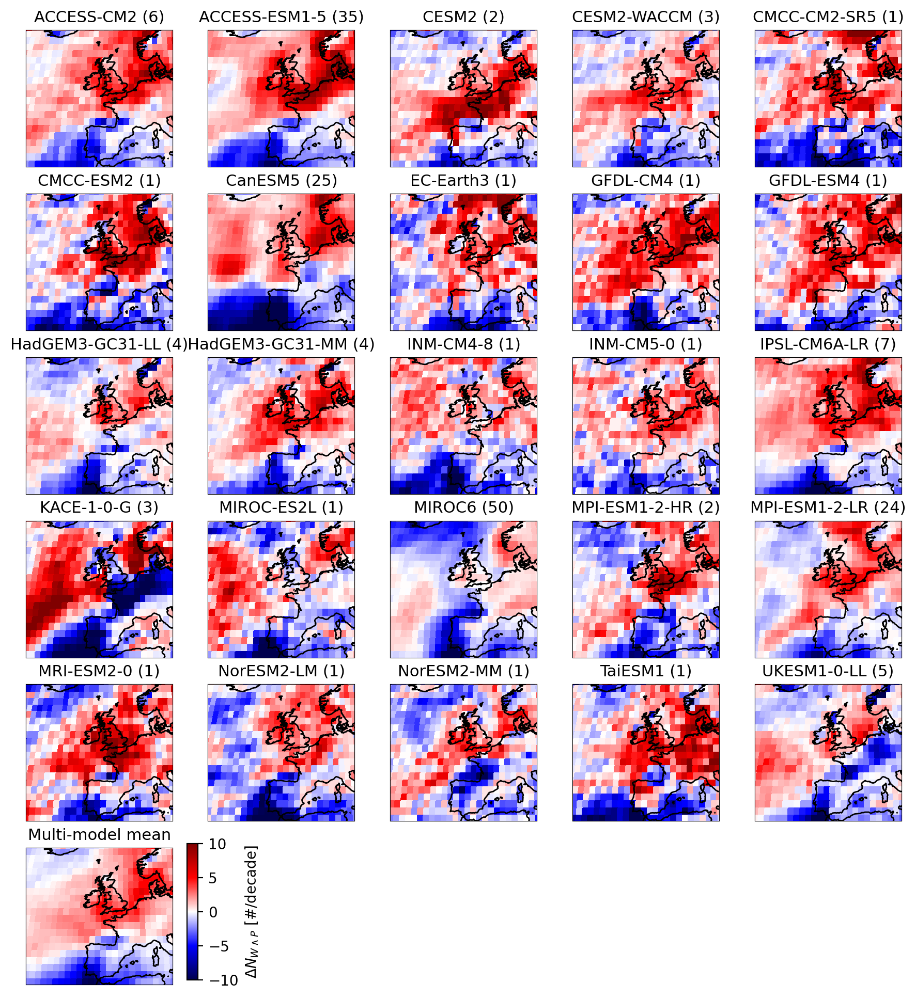

In [23]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_wp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(11,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    for m,model in enumerate(ssp_ds.source_id.values):
        n_members = np.isfinite(ssp_ds_present.sel(source_id=model)).sum(dim='member_id')[0,0].values
        if n_members==0:
            continue
        
        ax,sc = subplot_n_wp_eu(.25*ssp_ds_diff.sel(source_id=model).mean(dim='member_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','seismic',[-10,10],plot_cbar=False)
        ax.set_title(model +' ('+str(n_members)+')',size=11)
        i+=1
        if m==len(ssp_ds.source_id.values)-1:
            ax,sc = subplot_n_wp_eu(.25*ssp_ds_diff.mean(dim='member_id').mean(dim='source_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','seismic',[-10,10],plot_cbar=False)  
            ax.set_title('Multi-model mean',size=11)
            cax=ax.inset_axes(bounds=(1.1, 0.035,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')

    #fig.savefig('Figures/dn_WP_per_model_'+ssp+'.jpg',format='jpg',dpi=300,bbox_inches='tight')   

Uncertainty in terms:

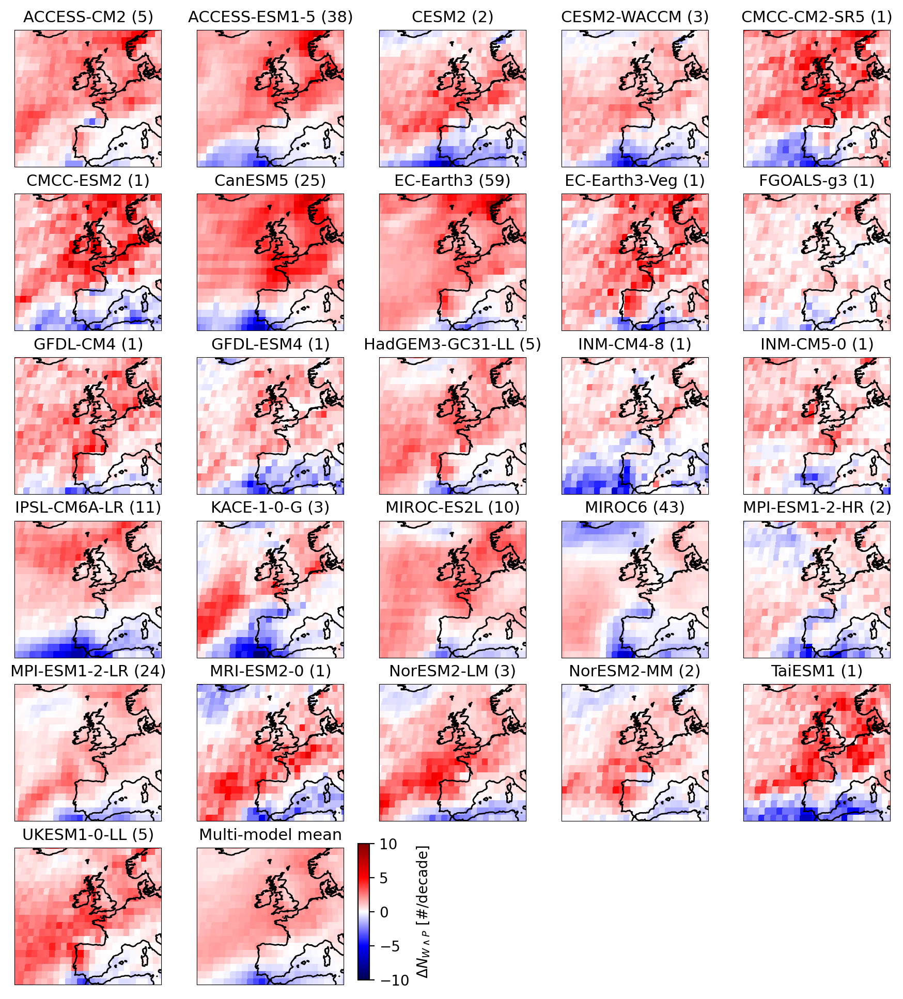

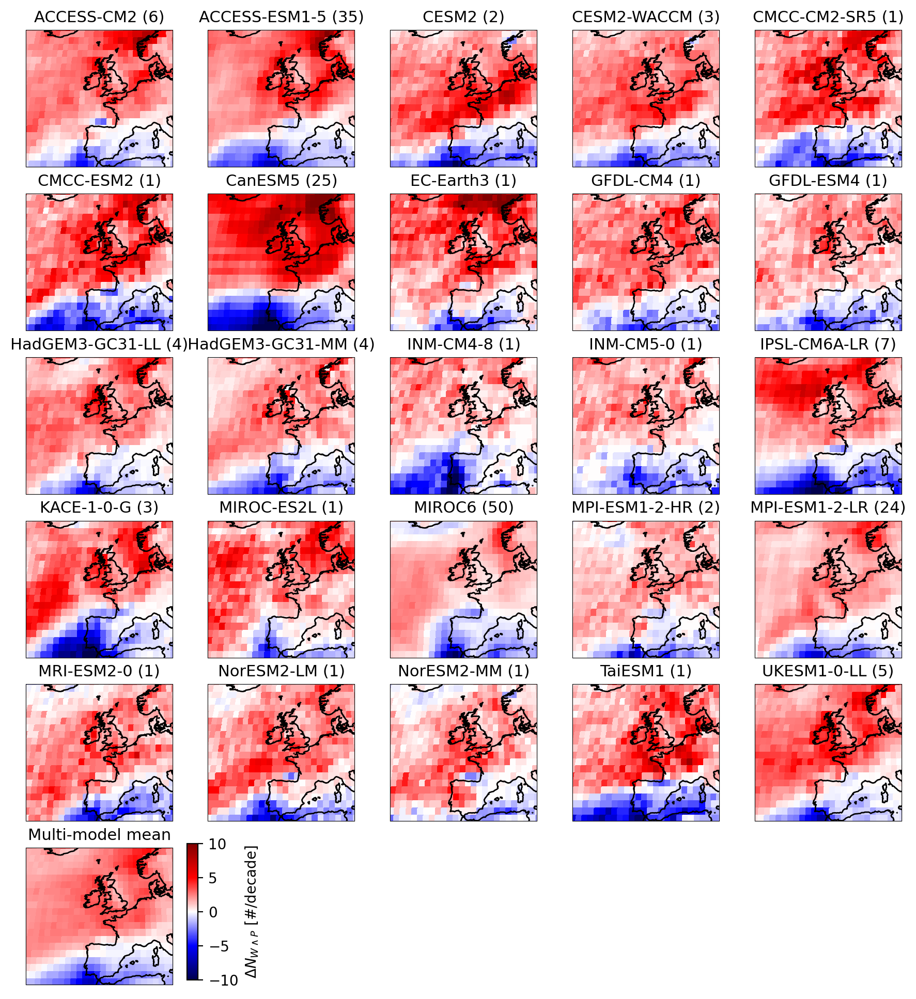

In [24]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_wp_decomp.num_joint_extremes_pr_driven.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(11,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    for m,model in enumerate(ssp_ds.source_id.values):
        n_members = np.isfinite(ssp_ds_present.sel(source_id=model)).sum(dim='member_id')[0,0].values
        if n_members==0:
            continue
        
        ax,sc = subplot_n_wp_eu(.25*ssp_ds_diff.sel(source_id=model).mean(dim='member_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','seismic',[-10,10],plot_cbar=False)
        ax.set_title(model +' ('+str(n_members)+')',size=11)
        i+=1
        if m==len(ssp_ds.source_id.values)-1:
            ax,sc = subplot_n_wp_eu(.25*ssp_ds_diff.mean(dim='member_id').mean(dim='source_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','seismic',[-10,10],plot_cbar=False)  
            ax.set_title('Multi-model mean',size=11)
            cax=ax.inset_axes(bounds=(1.1, 0.035,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            
    #fig.savefig('Figures/dn_WP_pr_driven_per_model_'+ssp+'.jpg',format='jpg',dpi=300,bbox_inches='tight')                    

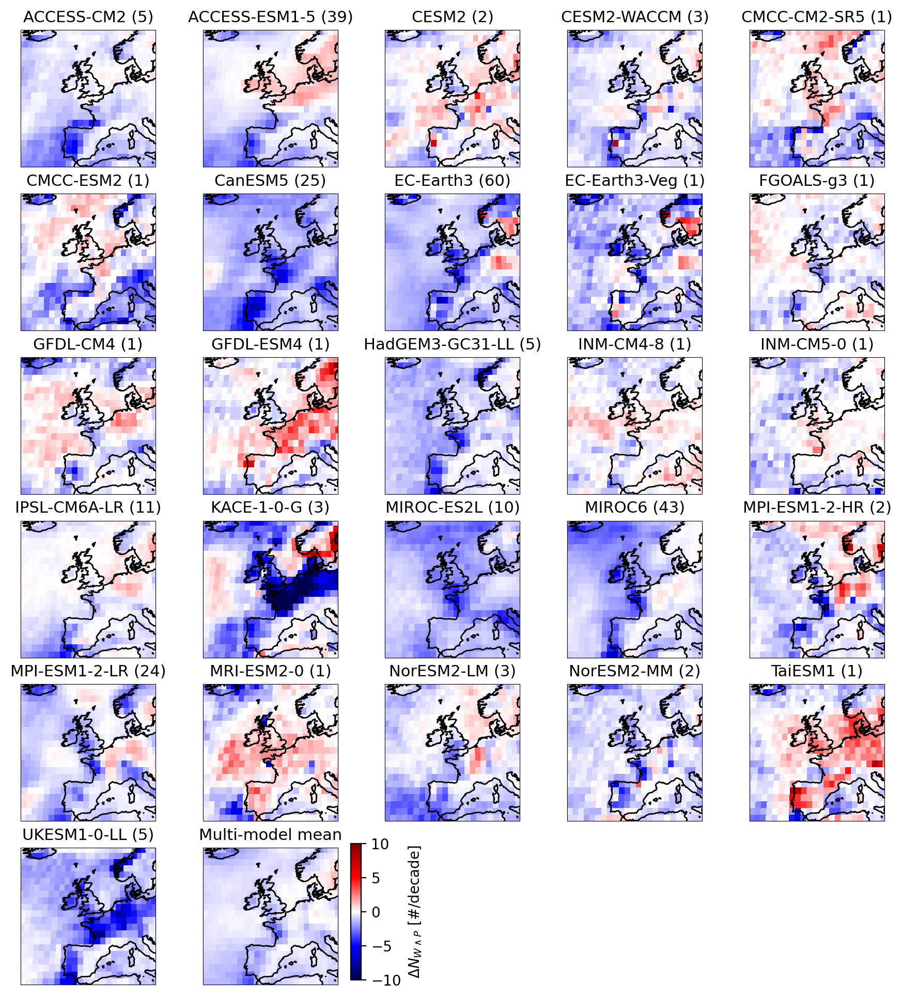

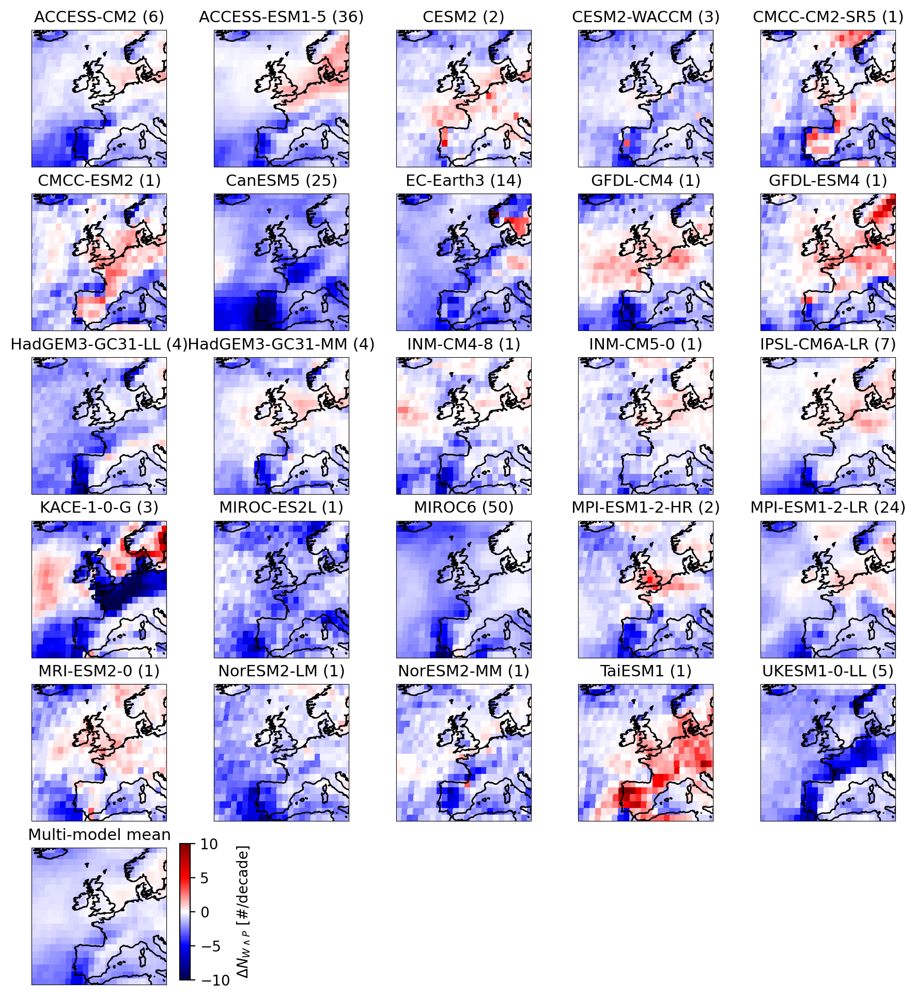

In [11]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_wp_decomp.num_joint_extremes_sfcWind_driven.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(11,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    for m,model in enumerate(ssp_ds.source_id.values):
        n_members = np.isfinite(ssp_ds_present.sel(source_id=model)).sum(dim='member_id')[0,0].values
        if n_members==0:
            continue
        
        ax,sc = subplot_n_wp_eu(.25*ssp_ds_diff.sel(source_id=model).mean(dim='member_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','seismic',[-10,10],plot_cbar=False)
        ax.set_title(model +' ('+str(n_members)+')',size=11)
        i+=1
        if m==len(ssp_ds.source_id.values)-1:
            ax,sc = subplot_n_wp_eu(.25*ssp_ds_diff.mean(dim='member_id').mean(dim='source_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','seismic',[-10,10],plot_cbar=False)  
            ax.set_title('Multi-model mean',size=11)
            cax=ax.inset_axes(bounds=(1.1, 0.035,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            
    #fig.savefig('Figures/dn_WP_sfcWind_driven_per_model_'+ssp+'.jpg',format='jpg',dpi=300,bbox_inches='tight')                 

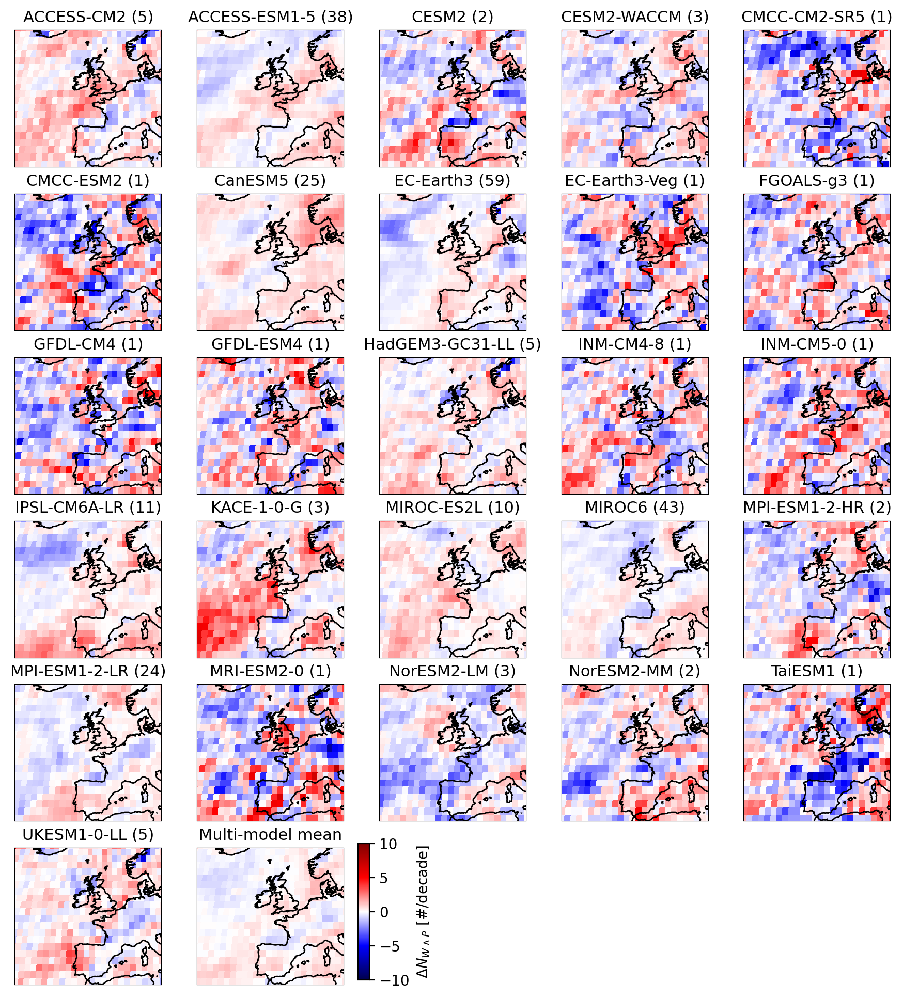

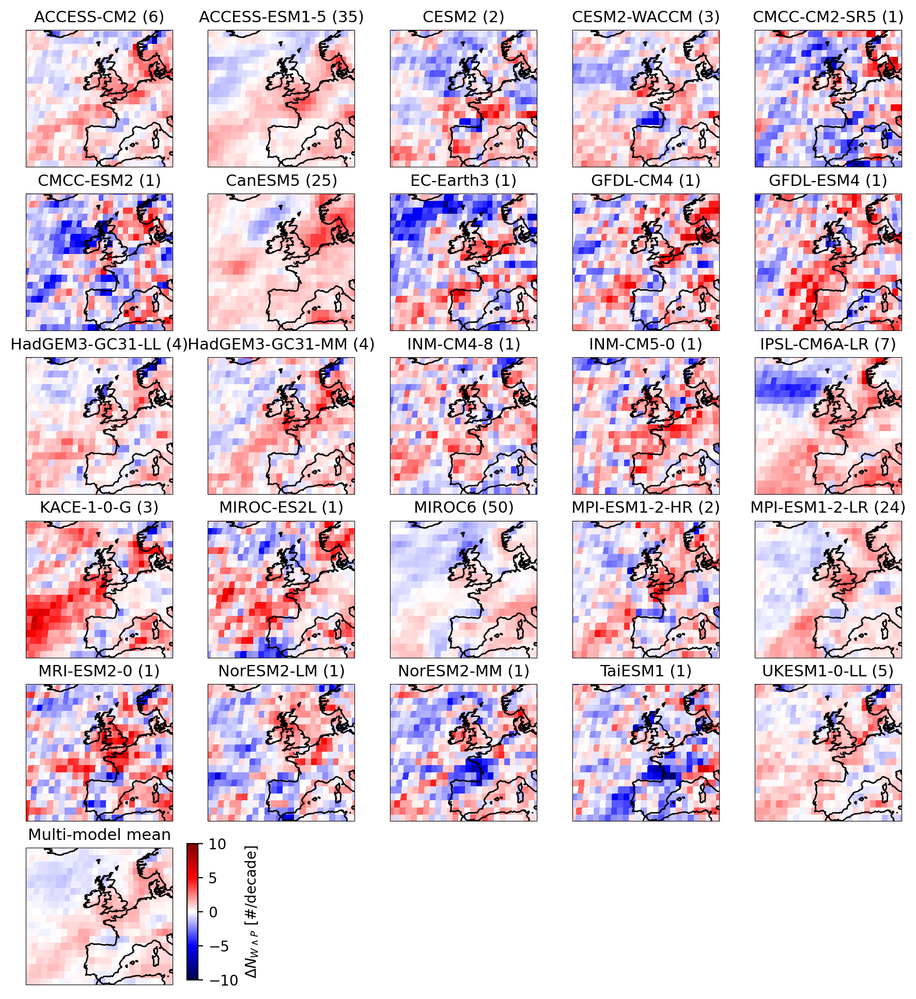

In [30]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_wp_decomp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present
    dependence_driven = (ssp_ds_diff.num_joint_extremes-ssp_ds_diff.num_joint_extremes_sfcWind_pr_driven)
    
    fig=plt.figure(figsize=(11,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    
    for m,model in enumerate(dependence_driven.source_id.values):
        n_members = np.isfinite(dependence_driven.sel(source_id=model)).sum(dim='member_id')[0,0].values
        if n_members==0:
            continue
       
        ax,sc = subplot_n_wp_eu(.25*dependence_driven.sel(source_id=model).mean(dim='member_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','seismic',[-10,10],plot_cbar=False)
        ax.set_title(model +' ('+str(n_members)+')',size=11)
        i+=1
        if m==len(ssp_ds.source_id.values)-1:
            ax,sc = subplot_n_wp_eu(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id'),[np.unravel_index(i,(6,5))[0],np.unravel_index(i,(6,5))[-1]],
                        '','seismic',[-10,10],plot_cbar=False)  
            ax.set_title('Multi-model mean',size=11)
            cax=ax.inset_axes(bounds=(1.1, 0.035,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            
    #fig.savefig('Figures/dn_WP_dependence_driven_per_model_'+ssp+'.jpg',format='jpg',dpi=300,bbox_inches='tight')